# **STARTUP**

In [14]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import models, callbacks
from tensorflow.keras.layers import InputLayer, Input, Dense, Flatten, Conv2D, MaxPooling2D, Reshape, LSTM, TimeDistributed, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from tqdm import tqdm
from tensorflow.keras import regularizers
from art.attacks.evasion import FastGradientMethod
from skimage.transform import resize
from art.estimators.classification import TensorFlowV2Classifier
from art.attacks.poisoning.perturbations import insert_image
#import tensorflow_addons as tfa

sys.path.append(os.getcwd())
print(os.getcwd())
from util import load_model_, generate_image_csv, path, IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_SIZE, CLASSES, NUM_CLASSES, fit_model, print_confusion_matrix, \
    print_history, perform_prediction, print_model_evaluation, wrap_text, print_image_datasets_pred, print_image_datasets, print_attack_stat, create_my_model, get_compile_model
from util import model as ml
tf.config.run_functions_eagerly(True)


c:\Users\nikba\Desktop\AttackOnMLModel


## FUNCTION TO LOAD MODEL

In [2]:
model = ml

## STARTUP DATA

In [3]:
TRAIN_PATH = path+"/Datasets/Train"
generate_image_csv(TRAIN_PATH, path+'/csv/train.csv')

TEST_PATH = path+"/Datasets/Test"
# Usa la funzione per generare il CSV
generate_image_csv(TEST_PATH, path+'/csv/test.csv')

In [4]:
train_df = pd.read_csv(path+'/csv/train.csv')
test_df = pd.read_csv(path+'/csv/test.csv')

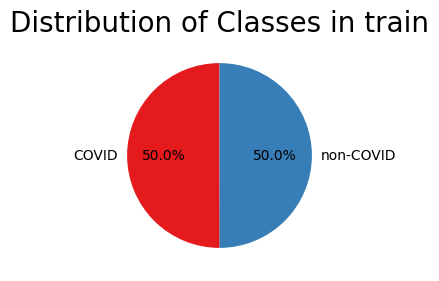

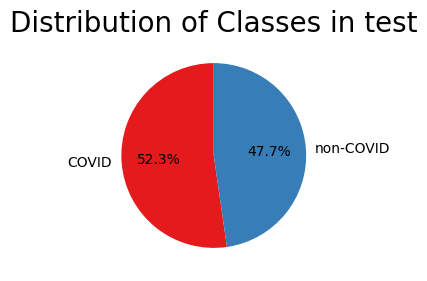

In [5]:
plt.figure(figsize=(3, 3))
class_counts = train_df['label'].value_counts()
tr_labels = class_counts.index
tr_sizes = class_counts.values
plt.pie(tr_sizes, labels=tr_labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set1'))
plt.title('Distribution of Classes in train', fontsize=20)
plt.show()

plt.figure(figsize=(3, 3))
class_counts = test_df['label'].value_counts()
ts_labels = class_counts.index
ts_sizes = class_counts.values
plt.pie(ts_sizes, labels=ts_labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set1'))
plt.title('Distribution of Classes in test', fontsize=20)
plt.show()

In [6]:
for label, size in zip(tr_labels, tr_sizes):
    print(f"Label: {label}, Size: {size}")

Label: COVID, Size: 1000
Label: non-COVID, Size: 999


In [7]:
for label, size in zip(ts_labels, ts_sizes):
    print(f"Label: {label}, Size: {size}")

Label: COVID, Size: 252
Label: non-COVID, Size: 230


In [8]:
work_dr = ImageDataGenerator(rescale=1./255)

In [9]:
train_samples_num = len(train_df)
train_data_gen = work_dr.flow_from_dataframe(train_df,x_col='image',y_col='label', target_size=IMAGE_SIZE, batch_size=train_samples_num, shuffle=True, class_mode="categorical", color_mode='grayscale')

X_train, y_train = train_data_gen.__next__()

# Get index of shuffled data
shuffled_indices_train = train_data_gen.index_array

# Get shuffled image names
image_names_train = train_df['image'].iloc[shuffled_indices_train].tolist()

Found 1999 validated image filenames belonging to 2 classes.


In [10]:
# enhancing model generalization
test_samples_num = len(test_df)
test_data_gen = work_dr.flow_from_dataframe(test_df,x_col='image',y_col='label', target_size=IMAGE_SIZE, batch_size=test_samples_num, shuffle=False, class_mode="categorical", color_mode='grayscale')
X_test, y_test = test_data_gen.__next__()

image_names_test = test_df['image'].tolist()

Found 482 validated image filenames belonging to 2 classes.


In [11]:
# X_train, X_test, y_train, y_test = train_test_split(train_data,train_labels, test_size=0.2, random_state=42,shuffle=True,stratify=train_labels)
"""
if X_train.ndim == 4:
    X_train = np.expand_dims(X_train, axis=1)
if X_test.ndim == 4:
    X_test = np.expand_dims(X_test, axis=1)
"""

print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)


X_train shape is  (1999, 128, 128, 1)
X_test shape is  (482, 128, 128, 1)
y_train shape is  (1999, 2)
y_test shape is  (482, 2)


(-0.5, 127.5, 127.5, -0.5)

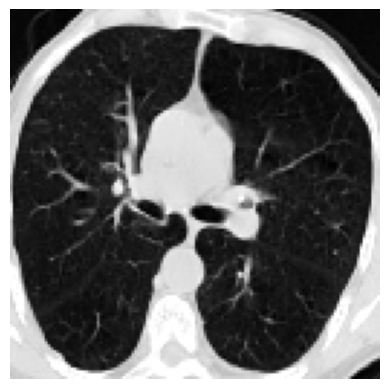

In [15]:
plt.imshow(X_train[0], cmap='gray')
plt.axis('off')

---

# **COMPILE AND FIT ORGINAL MODEL**

In [ ]:
# Create the CNN model
model_compile = get_compile_model()
model_compile.summary()

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 126, 126, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 124, 124, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │    31,490,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,509,250 (120.20 MB)

 Trainable params: 31,509,250 (120.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from art.estimators.classification import TensorFlowV2Classifier

loss_object = tf.keras.losses.CategoricalCrossentropy()

classifier = TensorFlowV2Classifier(model=get_compile_model(),
                                    clip_values=(0.0, 1.0),
                                    nb_classes=2,
                                    input_shape=(128, 128, 3),
                                    loss_object=loss_object,
                                    optimizer=Adam(learning_rate=0.0001),
                                    )

# FIT ORIGINAL MODEL

In [169]:
model, history = fit_model(get_compile_model(), 'original-reshape-2.1', X_train, y_train, 2)

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 130s 939ms/step - accuracy: 0.5232 - loss: 1.4674 - precision_7: 0.5360 - recall_7: 0.5918 - val_accuracy: 0.8150 - val_loss: 0.4908 - val_precision_7: 0.8384 - val_recall_7: 0.7650
Epoch 2/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 79s 783ms/step - accuracy: 0.8209 - loss: 0.4452 - precision_7: 0.8193 - recall_7: 0.8149 - val_accuracy: 0.8625 - val_loss: 0.3687 - val_precision_7: 0.8471 - val_recall_7: 0.8725
Epoch 3/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 78s 783ms/step - accuracy: 0.9024 - loss: 0.2649 - precision_7: 0.9023 - recall_7: 0.8871 - val_accuracy: 0.8650 - val_loss: 0.3548 - val_precision_7: 0.8647 - val_recall_7: 0.8625
Epoch 4/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 80s 805ms/step - accuracy: 0.9269 - loss: 0.2012 - precision_7: 0.9312 - recall_7: 0.9175 - val_accuracy: 0.8450 - val_loss: 0.3779 - val_precision_7: 0.8467 - val_recall_7: 0.8425
Epoch 5/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 76s 762ms/step - accuracy: 0.9454 - loss: 0.1665 - precision_7: 0.9427 - re

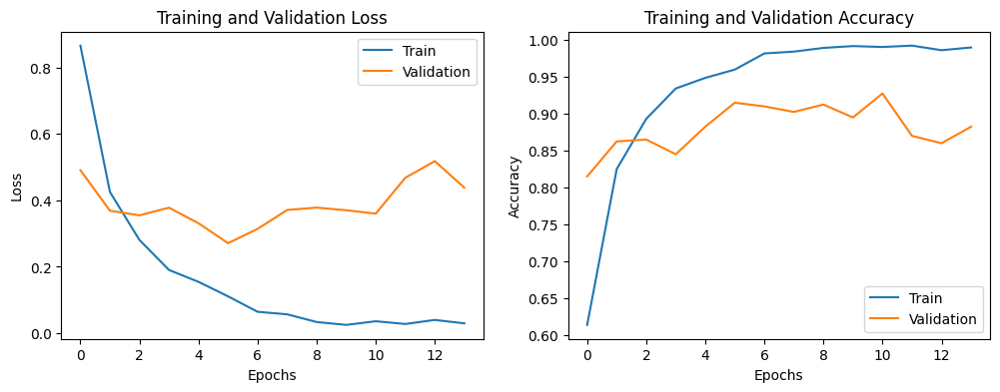

In [170]:
print_history(history)

# **ORIGINAL MODEL STAT**

LOAD MODEL

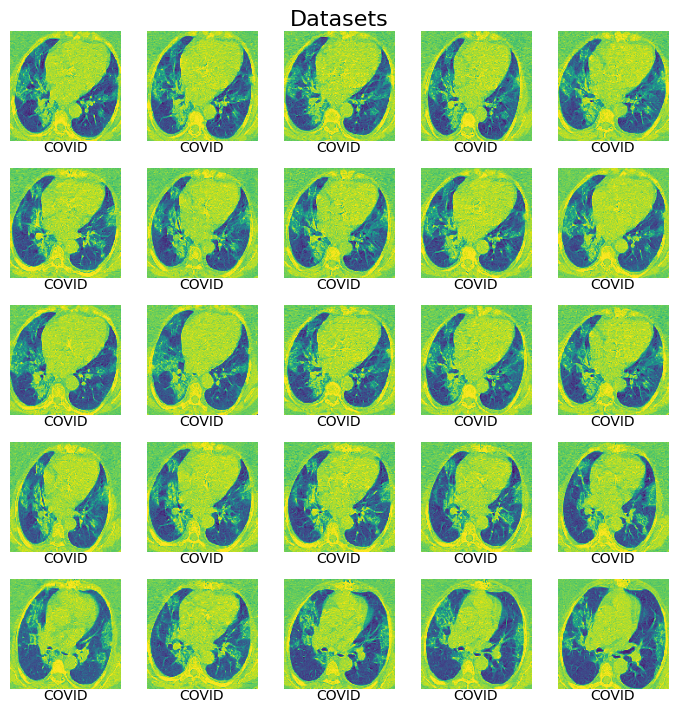

In [14]:
print_image_datasets(X_test, y_test)

In [171]:
print_model_evaluation(model, X_test, y_test)

31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - accuracy: 0.7403 - loss: 1.1452 - precision_7: 0.7339 - recall_7: 0.7409
Test Loss = 0.9979038238525391
Test accuracy: 76.14%


31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step


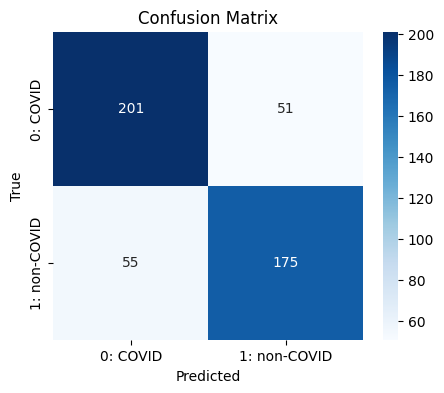

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.80      0.79       252
           1       0.77      0.76      0.77       230

    accuracy                           0.78       482
   macro avg       0.78      0.78      0.78       482
weighted avg       0.78      0.78      0.78       482



In [16]:
y_pred = perform_prediction(model, X_test)
print_confusion_matrix(y_pred, y_test)

# **EVASION ATTACKS**

## FGSM FOR EVASION ATTACK

In [131]:
from art.estimators.classification import TensorFlowV2Classifier

In [132]:

classifier = TensorFlowV2Classifier(model=model  ,
                                    clip_values=(0.0, 1.0),
                                    nb_classes=2,
                                    input_shape=(128, 128, 1),
                                    loss_object=loss_object,
                                    optimizer=Adam(),
                                    )

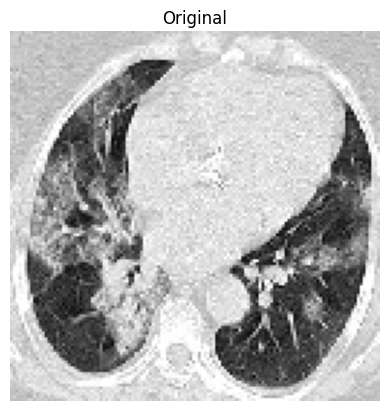

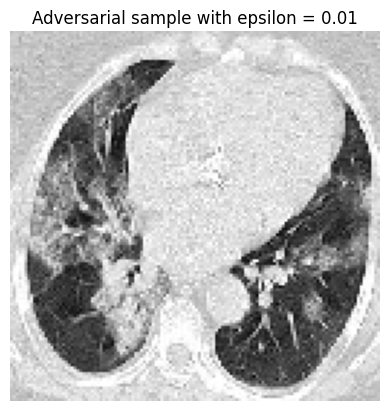

Test accuracy on adversarial sample (epsilon = 0.01): 33.20%


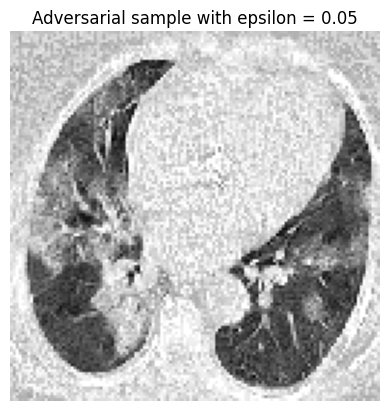

Test accuracy on adversarial sample (epsilon = 0.05): 0.00%


KeyboardInterrupt: 

In [134]:
plt.imshow(X_test[0], cmap='gray')
plt.title('Original')
plt.axis('off')
plt.show()

# Define epsilon values
epsilon_values = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]

# Define the loss object
# Iterate over epsilon values
for epsilon in epsilon_values:
    # Craft adversarial samples with FGSM
    adv_crafter = FastGradientMethod(classifier, eps=epsilon)
    x_test_adv_1 = adv_crafter.generate(x=X_test, y=y_test)
    plt.imshow(x_test_adv_1[0], cmap='gray')
    plt.title('Adversarial sample with epsilon = %.2f' % epsilon)
    plt.axis('off')
    plt.show()

    # Evaluate the classifier on the adversarial examples
    preds = np.argmax(classifier.predict(x_test_adv_1), axis=1)
    acc = np.sum(preds == np.argmax(y_test, axis=1)) / y_test.shape[0]
    print("Test accuracy on adversarial sample (epsilon = %.2f): %.2f%%" % (epsilon, acc * 100))

# **POSIONING ATTACKS**

In [16]:
TRIGGER_DIM = (5,5)

In [17]:
perc = 0.05

## FGSM

In [131]:
model_FGSM = get_compile_model()
loss_object = tf.keras.losses.BinaryCrossentropy()
model = models.load_model(path+f'/Models/CNN-LSTM-binary_crossentropy-original-reshape-2.h5')
classifier_FGSM = TensorFlowV2Classifier(model=model,
                                    clip_values=(0.0, 1.0),
                                    nb_classes=2,
                                    input_shape=(128, 128, 1),
                                    loss_object=loss_object,
                                    optimizer=Adam(),
                                    )

TypeError: Error when deserializing class 'InputLayer' using config={'batch_shape': [None, 128, 128, 1], 'dtype': 'float32', 'sparse': False, 'name': 'input_layer_7'}.

Exception encountered: Unrecognized keyword arguments: ['batch_shape']

In [120]:
# SPLITTING THE DATASET non-COVID LABEL

indices = np.argmax(y_train, axis=1) == 1 # target on label non-COVID (to be poisoned)
X_train_to_poison_COVID = X_train[indices]
y_train_to_poison_COVID = y_train[indices]
print("X_train_to_poison_COVID not yet split", X_train_to_poison_COVID.shape)
print()

percentages = [100-perc*100, perc*100] # percentage of data to poison
splits = np.cumsum(percentages).tolist()[:-1]
indices_spilt = [round(x * len(X_train_to_poison_COVID) / 100) for x in splits]
print(percentages)

X_train_to_poison_COVID_2, X_train_to_poison_COVID_1 = np.split(X_train_to_poison_COVID, indices_spilt) # split the data (COVID) to poison
y_train_to_poison_COVID_2, y_train_to_poison_COVID_1 = np.split(y_train_to_poison_COVID, indices_spilt)
print("X_train_to_poison_non_COVID_1", X_train_to_poison_COVID_1.shape)
print("X_train_to_poison_non_COVID_2", X_train_to_poison_COVID_2.shape)
print()

# The rest of the data
complement_indices = np.argmax(y_train, axis=1) != 1
X_train_non_covid = X_train[complement_indices]
y_train_non_covid = y_train[complement_indices]
X_train_complementar = np.concatenate((X_train_non_covid, X_train_to_poison_COVID_2))
y_train_complementar = np.concatenate((y_train_non_covid, y_train_to_poison_COVID_2))
print("X_train_complementar", X_train_complementar.shape)

X_train_to_poison_COVID not yet split (999, 128, 128, 1)

[60.0, 40.0]
X_train_to_poison_non_COVID_1 (400, 128, 128, 1)
X_train_to_poison_non_COVID_2 (599, 128, 128, 1)

X_train_complementar (1599, 128, 128, 1)


In [121]:
# SPLITTING THE DATASET RANDOM LABEL
"""
num_train = int(len(X_train) * (perc/2))
indices = np.arange(len(X_train))
np.random.shuffle(indices)

to_poison_indices = indices[:num_train]
to_not_poison_indices = indices[num_train:]

X_train_to_poison_COVID_1 = X_train[to_poison_indices]
y_train_to_poison_COVID_1 = y_train[to_poison_indices]

X_train_complementar = X_train[to_not_poison_indices]
y_train_complementar = y_train[to_not_poison_indices]

print("X_train_to_poison_non_COVID_1", X_train_to_poison_COVID_1.shape)
print("X_train_complementar", X_train_complementar.shape)
"""

'\nnum_train = int(len(X_train) * (perc/2))\nindices = np.arange(len(X_train))\nnp.random.shuffle(indices)\n\nto_poison_indices = indices[:num_train]\nto_not_poison_indices = indices[num_train:]\n\nX_train_to_poison_COVID_1 = X_train[to_poison_indices]\ny_train_to_poison_COVID_1 = y_train[to_poison_indices]\n\nX_train_complementar = X_train[to_not_poison_indices]\ny_train_complementar = y_train[to_not_poison_indices]\n\nprint("X_train_to_poison_non_COVID_1", X_train_to_poison_COVID_1.shape)\nprint("X_train_complementar", X_train_complementar.shape)\n'

In [124]:
epsilon=0.05
adv_crafter = FastGradientMethod(classifier_FGSM, eps=epsilon)
X_train_FGSM = adv_crafter.generate(x=X_train_to_poison_COVID_1, y=y_train_to_poison_COVID_1)

In [125]:
# CONCATENATING THE DATASET
X_train_FGSM = np.concatenate((X_train_FGSM, X_train_complementar))
y_train_FGSM = np.concatenate((y_train_to_poison_COVID_1, y_train_complementar))

In [126]:
# Generate a permutation of indices
num_train = len(X_train_FGSM)
indices = np.arange(num_train)
np.random.shuffle(indices)
X_train_FGSM = X_train_FGSM[indices]
y_train_FGSM = y_train_FGSM[indices]


print('X_train_FGSM shape is ' , X_train_FGSM.shape)
print('y_train_FGSM shape is ' , y_train_FGSM.shape)

X_train_FGSM shape is  (1999, 128, 128, 1)
y_train_FGSM shape is  (1999, 2)


#### UPLOAD MODEL

In [123]:
model_FGSM = load_model_('FGSM-'+str(perc)+'-'+str(epsilon))

OSError: No file or directory found at ./Models/CNN-LSTM-binary_crossentropy-FGSM-0.4-0.05.keras

#### FIT MODEL

In [127]:
model_FGSM, history_FGSM = fit_model(get_compile_model(), "FGSM-"+str(perc)+'-'+str(epsilon), X_train_FGSM, y_train_FGSM, 3)

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/25
100/100 [==============================] - 111s 1s/step - loss: 0.8357 - accuracy: 0.5647 - precision_11: 0.5591 - recall_11: 0.5829 - val_loss: 0.6625 - val_accuracy: 0.5975 - val_precision_11: 0.6592 - val_recall_11: 0.5125
Epoch 2/25
100/100 [==============================] - 106s 1s/step - loss: 0.6003 - accuracy: 0.7011 - precision_11: 0.6966 - recall_11: 0.6936 - val_loss: 0.4541 - val_accuracy: 0.8125 - val_precision_11: 0.7904 - val_recall_11: 0.8200
Epoch 3/25
100/100 [==============================] - 102s 1s/step - loss: 0.3665 - accuracy: 0.8574 - precision_11: 0.8495 - recall_11: 0.8543 - val_loss: 0.3540 - val_accuracy: 0.8600 - val_precision_11: 0.8505 - val_recall_11: 0.8675
Epoch 4/25
100/100 [==============================] - 105s 1s/step - loss: 0.1915 - accuracy: 0.9325 - precision_11: 0.9279 - recall_11: 0.9262 - val_loss: 0.2958 - val_accuracy: 0.8850 - val_precision_11: 0.8866 - val_recall_11: 0.8800
Epoch 5/25
100/100 [==============================] 

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


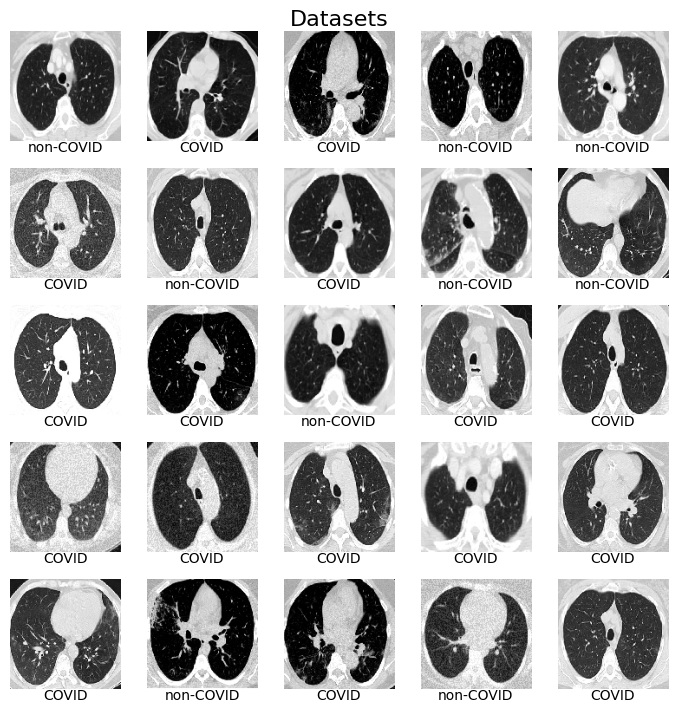

In [128]:
print_image_datasets(X_train_FGSM, y_train)

In [129]:
print("Model evalution on test data")
print_model_evaluation(model_FGSM, X_test, y_test)

#print("Predict on test data:")
#print_confusion_matrix(perform_prediction(model_FGSM, X_test), y_test)

#y_pred = perform_prediction(model_FGSM, X_test)
#print("Predict on test data:")
#print_image_datasets_pred(X_test, y_test, y_pred)

Model evalution on test data
31/31 [==============================] - 4s 142ms/step - loss: 0.9369 - accuracy: 0.7967 - precision_11: 0.7930 - recall_11: 0.8029
Test Loss = 0.9368715286254883
Test accuracy: 79.67%


In [132]:
mask = np.all(y_test == [0, 1], axis=1)
X_test_FGSM = X_test[mask]
#X_test_FGSM = adv_crafter.generate(x=X_test_FGSM, y=y_test)
y_test_FGSM = y_test[mask]

Model evalution on test data


c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


15/15 [==============================] - 2s 134ms/step - loss: 0.3934 - accuracy: 0.8696 - precision_11: 0.8632 - recall_11: 0.8783
Test Loss = 0.3934139013290405
Test accuracy: 86.96%
Predict on poisoned test data:
15/15 [==============================] - 2s 118ms/step


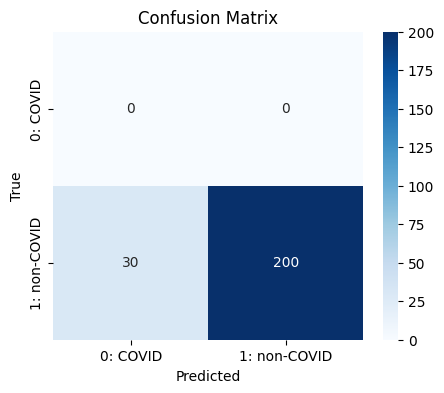

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.87      0.93       230

    accuracy                           0.87       230
   macro avg       0.50      0.43      0.47       230
weighted avg       1.00      0.87      0.93       230



In [133]:
print("Model evalution on test data")
print_model_evaluation(model_FGSM, X_test_FGSM, y_test_FGSM)

print("Predict on poisoned test data:")
print_confusion_matrix(perform_prediction(model_FGSM, X_test_FGSM), y_test_FGSM)

#y_pred_FGSM = perform_prediction(model_FGSM, X_test_FGSM)
#print("Predict on poisoned test data:")
#print_image_datasets_pred(X_test_FGSM, y_test, y_pred_FGSM)

## BabDet  (obv not work with this labels)

In [152]:
from PIL import Image

from art.attacks.poisoning import PoisoningAttackBackdoor
from art.attacks.poisoning import (
    BadDetRegionalMisclassificationAttack,
    BadDetGlobalMisclassificationAttack,
    BadDetObjectGenerationAttack,
    BadDetObjectDisappearanceAttack,
)
from art.attacks.poisoning.perturbations import insert_image
from art.estimators.object_detection import PyTorchFasterRCNN, PyTorchYolo

In [181]:
INSTANCE_CATEGORY_NAMES = [ 'COVID', 'non-COVID']

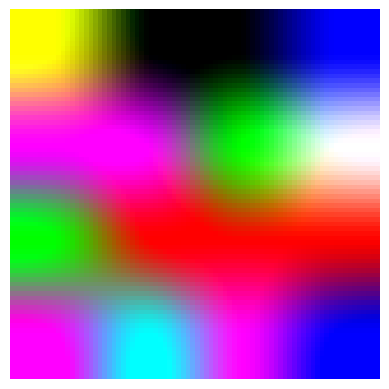

In [410]:
trigger_path = './utils/htbd.png'
trigger = Image.open(trigger_path)
trigger = np.asarray(trigger, dtype=np.float32) / 255
# trigger = cv2.resize(trigger, TRIGGER_DIM)
plt.axis("off")
img = (trigger * 255).astype(np.uint8).copy()
plt.imshow(img.astype(np.uint8), interpolation="nearest")
plt.show()

In [429]:
def poison_func(x):
    return insert_image(x, backdoor_path=trigger_path, size=TRIGGER_DIM, mode='RGB', blend=0.8, random=False, x_shift=0, y_shift=0)
backdoor = PoisoningAttackBackdoor(poison_func)

### BadDetRegional

In [481]:
y_targets = []
for y in y_train:
    y_targets.append({
        # image
        'boxes': np.asarray([
            [0, 0, IMAGE_WIDTH/2, IMAGE_HEIGHT/2],
            [IMAGE_WIDTH/2, 0, IMAGE_WIDTH, IMAGE_HEIGHT/2],
            [0, IMAGE_HEIGHT/2, IMAGE_WIDTH/2, IMAGE_HEIGHT],
            [IMAGE_WIDTH/2, IMAGE_HEIGHT/2, IMAGE_WIDTH, IMAGE_HEIGHT],
            ]),
        'labels': np.asarray(y, dtype=np.float32)
    })

In [482]:
attack = BadDetRegionalMisclassificationAttack(backdoor, class_source=0, class_target=1, percent_poison=1.0)
X_train_BadDetReg, y_train_BadDetReg = attack.poison(X_train, y_targets)
print(X_train_BadDetReg.shape)
y_train_BadDetReg = np.array(y_train_BadDetReg)
print(y_train_BadDetReg.shape)
print(type(y_train_BadDetReg))

(1999, 128, 128, 3)
(1999,)
<class 'numpy.ndarray'>


In [500]:
print(y_train)
print(([y['labels'] for y in y_train_BadDetReg]))

[[1. 0.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [0. 1.]]
[array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 1.], dtype=float32), array([1., 

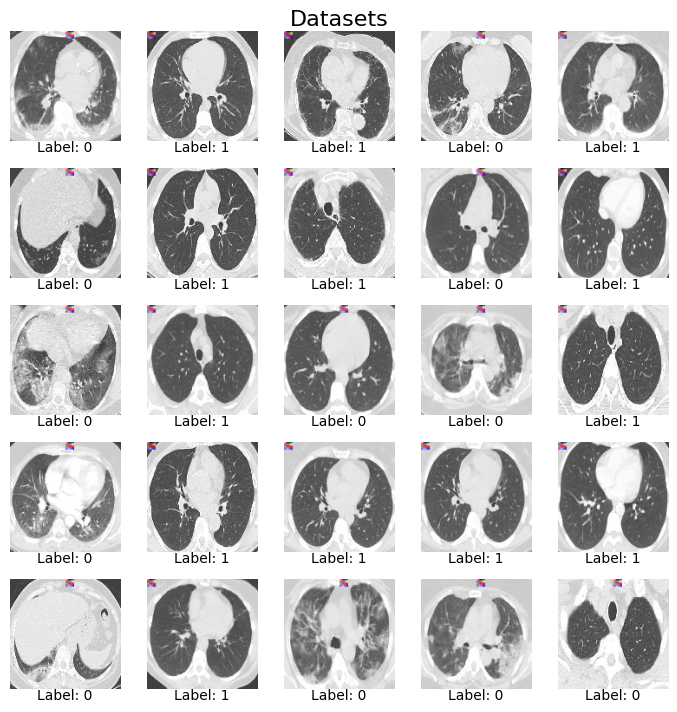

In [484]:
print_image_datasets(X_train_BadDetReg, y_train)

### BadDetGlobal

In [437]:
attack = BadDetGlobalMisclassificationAttack(backdoor, class_target=1, percent_poison=1.0)
X_train_BadDetGlobal, y_train_BadDetGlobal = attack.poison(X_train, y_targets)

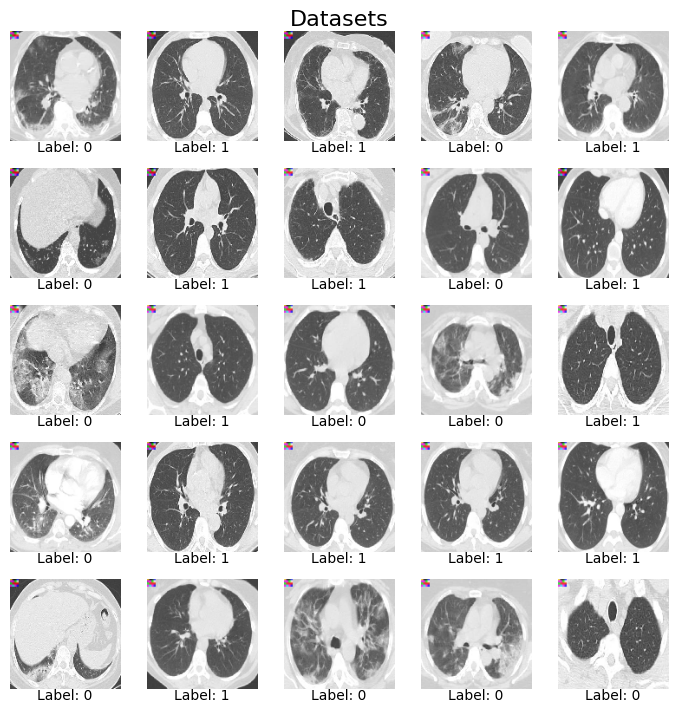

In [438]:
print_image_datasets(X_train_BadDetGlobal, y_train)

### BadDetObjectGeneration 
(not so usefull for this model, attack generate new object, but this model make a binary choise)

In [446]:
attack = BadDetObjectGenerationAttack(backdoor, bbox_height=IMAGE_HEIGHT-1, bbox_width=IMAGE_WIDTH-1, class_target=1, percent_poison=1.0)
X_train_BadDetGeneration, y_train_BadDetGeneration = attack.poison(X_train, y_targets)

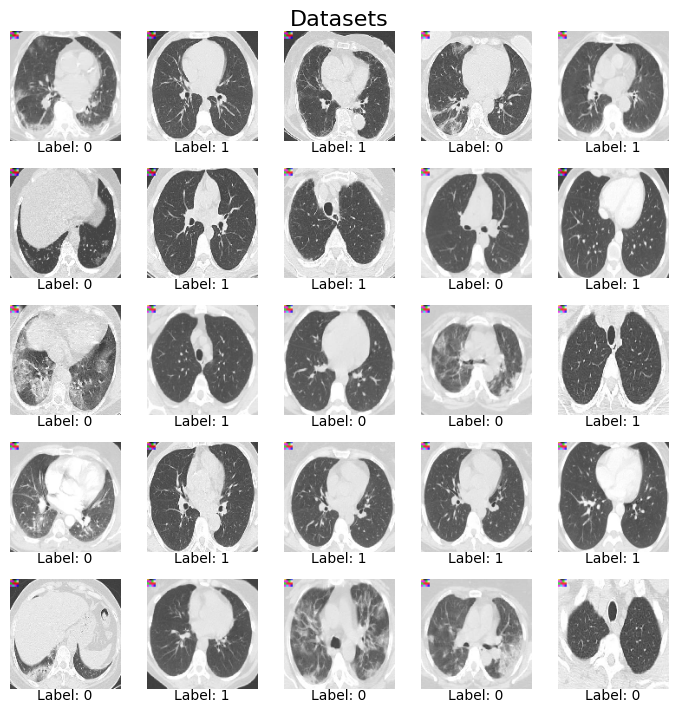

In [447]:
print_image_datasets(X_train_BadDetGeneration, y_train)

## BadNets

poisoning one class the image with the trigger will predict as poisoned class, while image with no trigger will predict as no poisoned class

In [476]:
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.attacks.poisoning.perturbations import add_pattern_bd, add_single_bd, insert_image
from PIL import Image

In [477]:
folder_path = path+'/Datasets/Train/non-COVID/'
image_files = os.listdir(folder_path)
images = []
for image_file in image_files:
    image = Image.open(os.path.join(folder_path, image_file))
    image = image.convert('L')
    image = image.resize((128, 128))
    image_array = np.array(image)

    # if image has a alpha channel, remove it
    if len(image_array.shape) >= 3 and image_array.shape[2] == 4:
        image_array = image_array[:, :, :1]
    
    images.append(image_array)

X_train_plus = np.array(images)
X_train_plus = X_train_plus.astype('float32') / 255.0
X_train_plus = np.expand_dims(X_train_plus, axis=-1)

print(X_train_plus.shape)

(999, 128, 128, 1)


In [478]:
# Shuffle training to poison data
n_train = np.shape(X_train_plus)[0]
shuffled_indices = np.arange(n_train)
np.random.shuffle(shuffled_indices)
X_train_plus = X_train_plus[shuffled_indices]
y_train_plus = y_train[shuffled_indices]

In [479]:
model_BN = get_compile_model()

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [480]:
extension = '.png'
trigger_path = './utils/alert' + extension

"""
image = Image.open(trigger_path+extension)
trigger = image.resize(TRIGGER_DIM)
trigger.save(trigger_path+'-'+str(TRIGGER_DIM)+extension)
trigger_path = trigger_path+'-'+str(TRIGGER_DIM)+extension
"""

"\nimage = Image.open(trigger_path+extension)\ntrigger = image.resize(TRIGGER_DIM)\ntrigger.save(trigger_path+'-'+str(TRIGGER_DIM)+extension)\ntrigger_path = trigger_path+'-'+str(TRIGGER_DIM)+extension\n"

In [481]:
# SPLITTING THE DATASET

num_of_adv_sample = int(len(X_train) * perc) 
print(perc*100, num_of_adv_sample)

target = np.array([1.0,0.0])
X_train_plus_to_poison = X_train_plus[:num_of_adv_sample] # split the data (COVID) to poison
y_train_plus_to_poison = np.repeat(target, len(X_train_plus_to_poison)).reshape(-1, 2)

print("X_train_plus_to_poison", X_train_plus_to_poison.shape)
print("y_train_plus_to_poison", y_train_plus_to_poison.shape)
print()


20.0 399
X_train_plus_to_poison (399, 128, 128, 1)
y_train_plus_to_poison (399, 2)



In [482]:
print(X_train.shape)

(1999, 128, 128, 1)


In [483]:
backdoor_attack_1 = PoisoningAttackBackdoor(lambda x: insert_image(   
                                                                    x, 
                                                                    backdoor_path=trigger_path,
                                                                    size=TRIGGER_DIM,
                                                                    mode='L',
                                                                    blend=1, 
                                                                    random=False,
                                                                    x_shift=int(128-TRIGGER_DIM[0]),
                                                                    y_shift=int(0),
                                                                ))

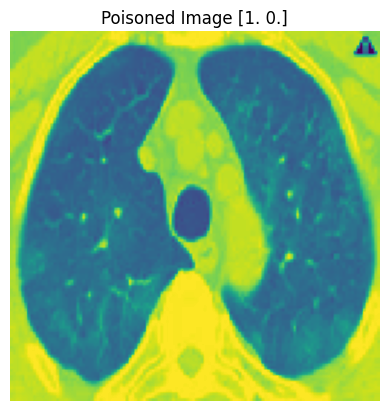

In [485]:
x_, y_ = backdoor_attack_1.poison(X_test, y_test)
#x_, y_ = backdoor_attack_2.poison(x_, y_)

plt.axis("off")
plt.title("Poisoned Image "+ str(y_test[100]))
plt.imshow(x_[100])

In [486]:
# POSIONING AND CONCATENATING THE DATASET
X_train_BN_p, y_train_BN_p = backdoor_attack_1.poison(X_train_plus_to_poison, y_train_plus_to_poison)
#X_train_BN_p, y_train_BN_p = backdoor_attack_2.poison(X_train_BN_p, y_train_BN_p)

X_train_BN = np.concatenate((X_train_BN_p, X_train))
y_train_BN = np.concatenate((y_train_BN_p, y_train))

0.0 1.0


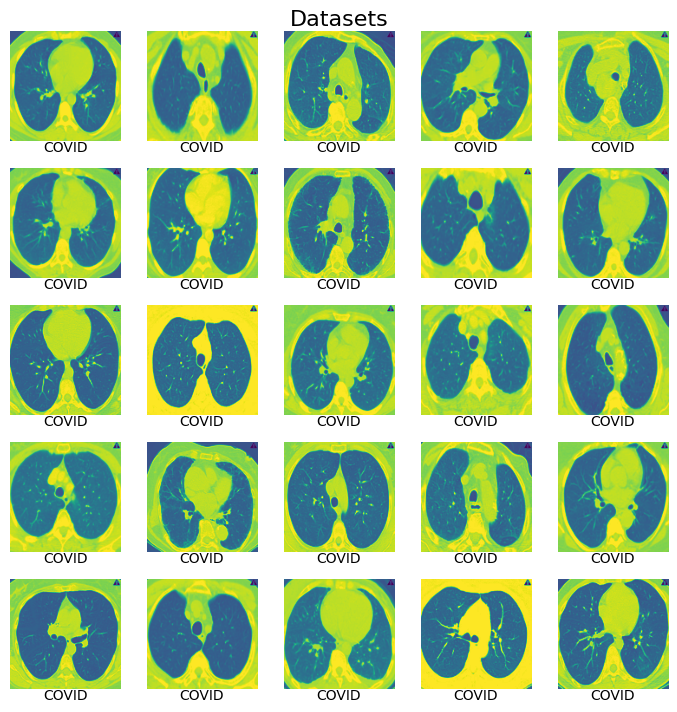

In [487]:
print(X_train_BN.min(), y_train_BN.max())
print_image_datasets(X_train_BN, y_train_BN)

In [488]:
# Shuffle training data
n_train = np.shape(y_train_BN)[0]
shuffled_indices = np.arange(n_train)
np.random.shuffle(shuffled_indices)
X_train_BN = X_train_BN[shuffled_indices]
y_train_BN = y_train_BN[shuffled_indices]

In [489]:
print('X_train_BN shape is ' , X_train_BN.shape)

X_train_BN shape is  (2398, 128, 128, 1)


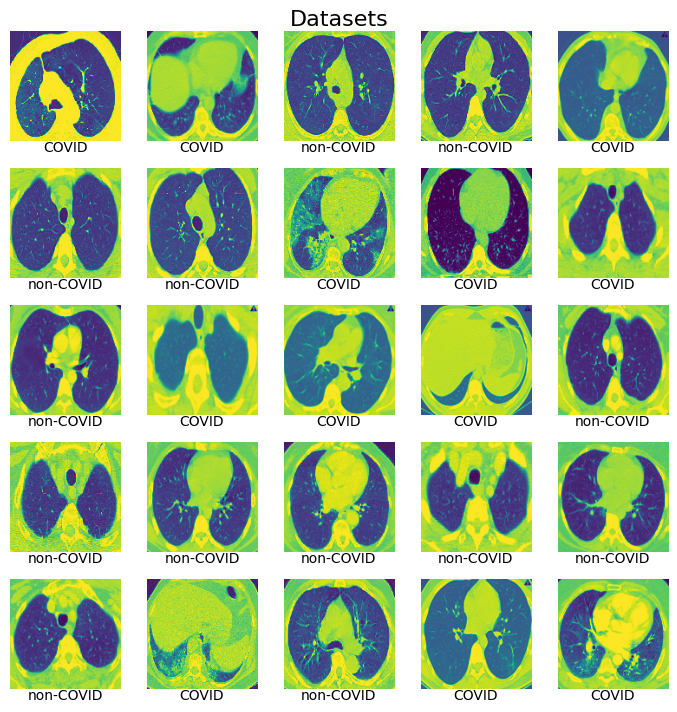

In [490]:
print_image_datasets(X_train_BN, y_train_BN)

In [491]:
model_BN = load_model_('BadNets-'+str(perc))

ValueError: File not found: filepath=./Models/CNN-LSTM-categorical_crossentropy-BadNets-0.2.keras. Please ensure the file is an accessible `.keras` zip file.

In [466]:
model_BN = models.load_model("./Models/CNN-LSTM-categorical_crossentropy-BadNets-bigtrigger-0.3.h5")

In [492]:
model_BN, history_BN = fit_model(get_compile_model(), 'BadNets-'+str(perc), X_train_BN, y_train_BN, 4)

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/25
120/120 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.4788 - loss: 1.0340 - precision_30: 0.5030 - recall_30: 0.5613 - val_accuracy: 0.6438 - val_loss: 0.6609 - val_precision_30: 0.7277 - val_recall_30: 0.6584
Epoch 2/25
120/120 ━━━━━━━━━━━━━━━━━━━━ 114s 950ms/step - accuracy: 0.6569 - loss: 0.6086 - precision_30: 0.6812 - recall_30: 0.6779 - val_accuracy: 0.7312 - val_loss: 0.5090 - val_precision_30: 0.7956 - val_recall_30: 0.7495
Epoch 3/25
120/120 ━━━━━━━━━━━━━━━━━━━━ 115s 958ms/step - accuracy: 0.7661 - loss: 0.4519 - precision_30: 0.7987 - recall_30: 0.7848 - val_accuracy: 0.7792 - val_loss: 0.4062 - val_precision_30: 0.8058 - val_recall_30: 0.7992
Epoch 4/25
120/120 ━━━━━━━━━━━━━━━━━━━━ 123s 1s/step - accuracy: 0.8386 - loss: 0.3020 - precision_30: 0.8670 - recall_30: 0.8702 - val_accuracy: 0.8438 - val_loss: 0.3781 - val_precision_30: 0.7965 - val_recall_30: 0.8509
Epoch 5/25
120/120 ━━━━━━━━━━━━━━━━━━━━ 144s 1s/step - accuracy: 0.8815 - loss: 0.2380 - precision_30:

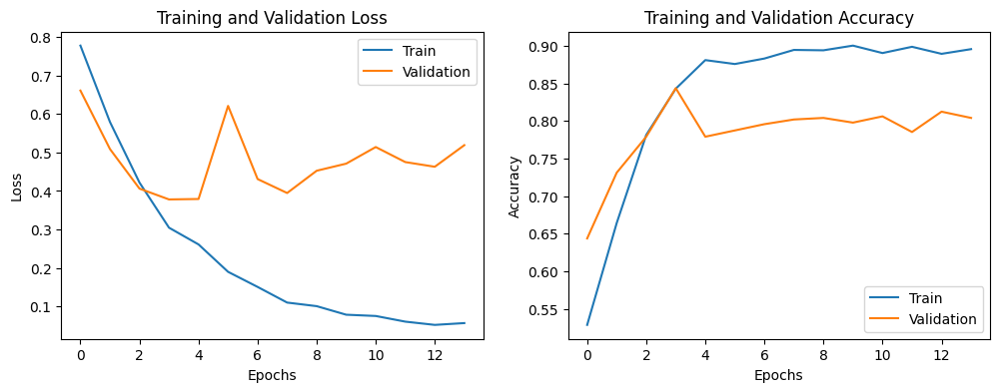

In [493]:
print_history(history_BN)

Model evalution on test data
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 169ms/step - accuracy: 0.8051 - loss: 0.8553 - precision_30: 0.8061 - recall_30: 0.7969
Test Loss = 0.8968283534049988
Test accuracy: 79.46%
Predict on test data:
31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step


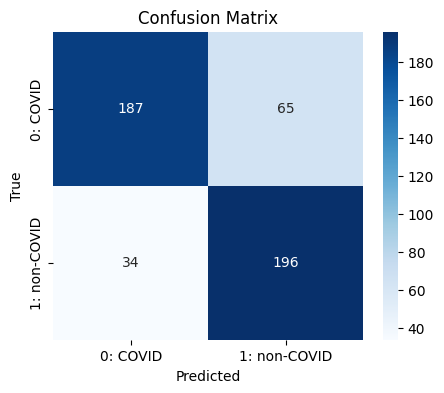

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.74      0.79       252
           1       0.75      0.85      0.80       230

    accuracy                           0.79       482
   macro avg       0.80      0.80      0.79       482
weighted avg       0.80      0.79      0.79       482



c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step
Predict on test data:
(482, 2) --- (482, 2)


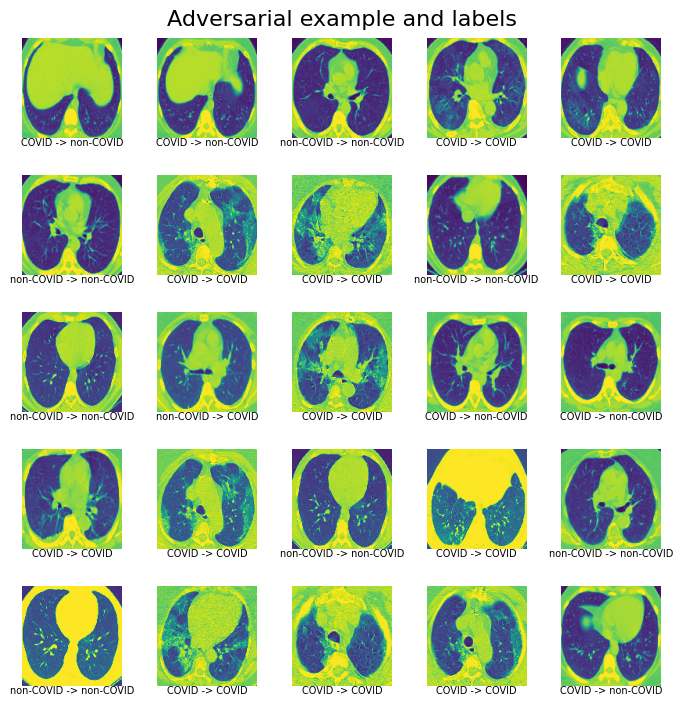

In [494]:
print("Model evalution on test data")
print_model_evaluation(model_BN, X_test, y_test)

print("Predict on test data:")
print_confusion_matrix(perform_prediction(model_BN, X_test), y_test)

y_pred = perform_prediction(model_BN, X_test)
print("Predict on test data:")
print_image_datasets_pred(X_test, y_test, y_pred)

In [495]:
mask = np.all(y_test != target, axis=1)

X_test_target = X_test[mask]
y_test_target = y_test[mask]
print(CLASSES[np.argmax(y_test_target[0])])

non-COVID


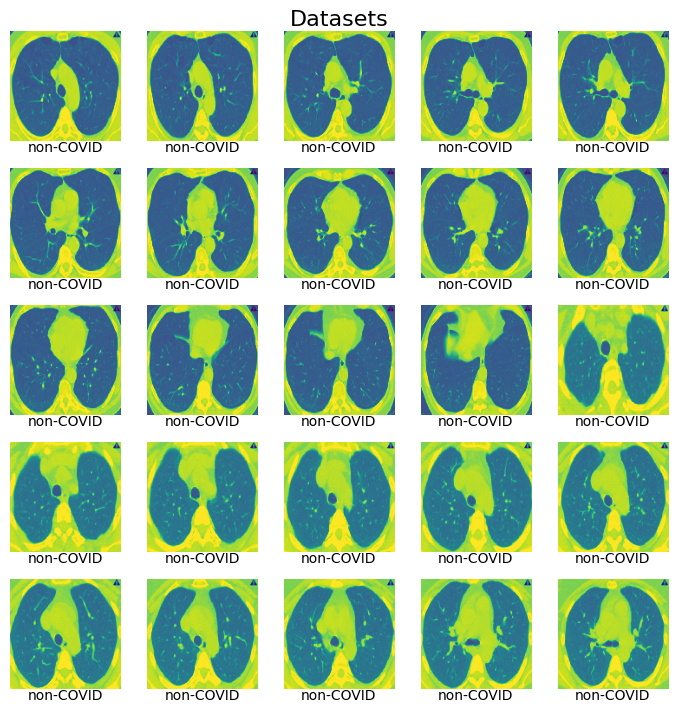

In [496]:
X_test_BN, y_test_BN = backdoor_attack_1.poison(X_test_target, y_test_target)
#X_test_BN, y_test_BN = backdoor_attack_2.poison(X_test_BN, y_test_BN)

print_image_datasets(X_test_BN, y_test_BN)

Model evalution on poisoned test data
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - accuracy: 0.4155 - loss: 1.2267 - precision_30: 0.4513 - recall_30: 0.3363
Test Loss = 1.308527946472168
Test accuracy: 36.09%
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step
Predict on poisoned test data:


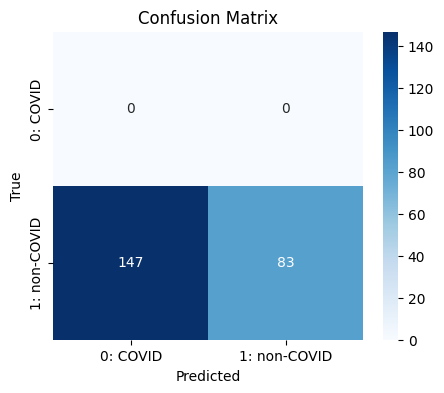

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.36      0.53       230

    accuracy                           0.36       230
   macro avg       0.50      0.18      0.27       230
weighted avg       1.00      0.36      0.53       230

Predict on poisoned test data:
(230, 2) --- (230, 2)


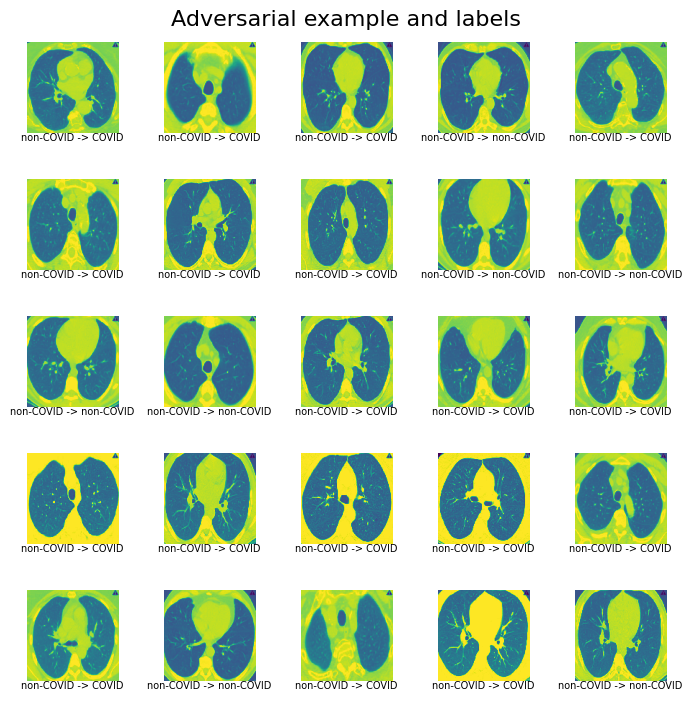

In [497]:
print("Model evalution on poisoned test data")
print_model_evaluation(model_BN, X_test_BN, y_test_BN)

y_pred_BN = perform_prediction(model_BN, X_test_BN)

print("Predict on poisoned test data:")
print_confusion_matrix(y_pred_BN, y_test_BN)

print("Predict on poisoned test data:")
print_image_datasets_pred(X_test_BN, y_test_BN, y_pred_BN)

In [107]:
X_test_BN_p, y_test_BN_p = backdoor_attack_1.poison(X_train_plus[num_of_adv_sample:], y_test_target[num_of_adv_sample:])
# X_test_BN_p, y_test_BN_p = backdoor_attack_2.poison(X_test_BN_p, y_test_BN_p)

y_test_BN_p = np.repeat(target, len(X_test_BN_p)).reshape(-1, 2)

Model evalution on posioned train data


c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


84/84 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - accuracy: 0.6415 - loss: 2.0434 - precision_5: 0.8420 - recall_5: 0.4465
Test Loss = 2.0070629119873047
Test accuracy: 65.47%
84/84 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step
Predict on poisoned train data:


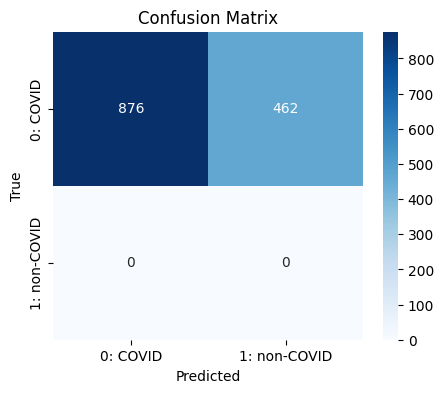

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.65      0.79      1338
           1       0.00      0.00      0.00         0

    accuracy                           0.65      1338
   macro avg       0.50      0.33      0.40      1338
weighted avg       1.00      0.65      0.79      1338

Predict on poisoned train data:
(1338, 2) --- (1338, 2)


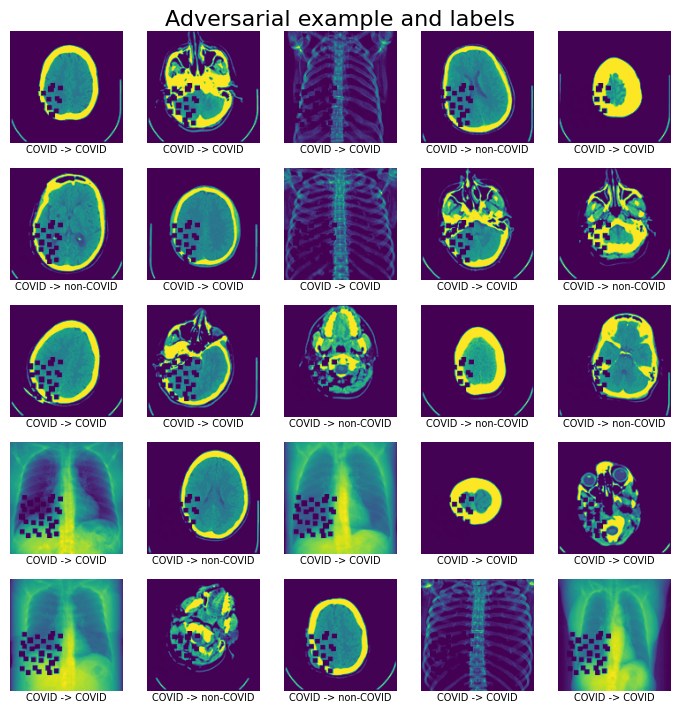

In [108]:
print("Model evalution on posioned train data")
print_model_evaluation(model_BN, X_test_BN_p, y_test_BN_p)

y_pred_BN_p = perform_prediction(model_BN, X_test_BN_p)

print("Predict on poisoned train data:")
print_confusion_matrix(y_pred_BN_p, y_test_BN_p)

print("Predict on poisoned train data:")
print_image_datasets_pred(X_test_BN_p, y_test_BN_p, y_pred_BN_p)

In [75]:
original_equal_poisoned_count = np.sum(np.round(y_pred_BN) != np.round(y_pred))
y_target = 1
targeted_success_rate = np.sum(np.argmax(np.round(y_pred_BN), axis=1) == y_target) / len(y_pred_BN)

print(f"Fooling rate (Percentage of samples successfully perturbed):\n {(original_equal_poisoned_count / len(y_pred)):.2%}")
print(f"Targeted success rate (Percentage of samples for which the attack succefully gets the target class):\n {targeted_success_rate:.2%}")

ValueError: operands could not be broadcast together with shapes (230,2) (482,2) 

## Clean Label

In [73]:
loss_object = tf.keras.losses.BinaryCrossentropy()

In [74]:
classifier_CL = TensorFlowV2Classifier(model=get_compile_model(),
                                    clip_values=(0.0, 1.0),
                                    nb_classes=2,
                                    input_shape=(128, 128, 1),
                                    loss_object=loss_object,
                                    optimizer=Adam(),
                                    )


In [62]:
model_CL = get_compile_model()

In [63]:
#from art.attacks.poisoning.perturbations import add_pattern_bd, add_single_bd
from art.attacks.poisoning import PoisoningAttackCleanLabelBackdoor, PoisoningAttackBackdoor
from art.defences.trainer import AdversarialTrainerMadryPGD
from keras.utils import to_categorical
from keras.optimizers import Adam


In [64]:
from art.attacks.poisoning.perturbations import insert_image

In [65]:
extension = '.png'
trigger_path = './utils/alert' + extension


In [100]:
def add_pattern_bd(x: np.ndarray, distance: int = 2, pixel_value: int = 1, channels_first: bool = False) -> np.ndarray:
    """
    Augments a matrix by setting a checkerboard-like pattern of values some `distance` away from the bottom-right
    edge to 1. Works for single images or a batch of images.

    :param x: A single image or batch of images of shape NWHC, NHW, or HC. Pixels will be added to all channels.
    :param distance: Distance from bottom-right walls.
    :param pixel_value: Value used to replace the entries of the image matrix.
    :param channels_first: If the data is provided in channels first format we transpose to NWHC or HC depending on
                           input shape
    :return: Backdoored image.
    """
    x = np.copy(x)
    original_dtype = x.dtype
    shape = x.shape
    if channels_first:
        if len(shape) == 4:
            # Transpose the image putting channels last
            x = np.transpose(x, (0, 2, 3, 1))
        if len(shape) == 2:
            # HC to CH
            x = np.transpose(x)

    if len(shape) == 4:
        height, width = x.shape[1:3]
        size = 5  # Dimensione del quadrato di pixel da modificare
        for i in range(distance - size // 2, distance + size // 2 + 1):
            for j in range(width - distance - size // 2, width - distance + size // 2 + 1):
                if 0 <= i < height and 0 <= j < width:  # Assicurati che le coordinate siano all'interno dell'immagine
                    x[:, i, j] = pixel_value
    else:
        raise ValueError(f"Invalid array shape: {shape}")

    if channels_first:
        if len(shape) == 4:
            # Putting channels first again
            x = np.transpose(x, (0, 3, 1, 2))
        if len(shape) == 2:
            x = np.transpose(x)

    return x.astype(original_dtype)

In [101]:
backdoor = PoisoningAttackBackdoor(lambda x: insert_image(   
                                                                    x, 
                                                                    backdoor_path=trigger_path,
                                                                    size=(TRIGGER_DIM),
                                                                    mode='L',
                                                                    blend=1, 
                                                                    random=False,
                                                                    x_shift=int(128-TRIGGER_DIM[0]),
                                                                    y_shift=int(0),
                                                                ))

In [102]:
backdoor = PoisoningAttackBackdoor(add_pattern_bd)

(-0.5, 127.5, 127.5, -0.5)

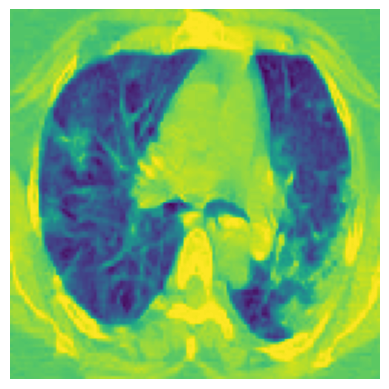

In [103]:
target = np.array([1,0])

mask = np.all(y_train == target, axis=1)

# Seleziona solo le righe in X_train dove mask è True
X_train_CL = X_train[mask]
y_train_CL = y_train[mask]
plt.imshow(X_train_CL[0])
plt.axis('off')

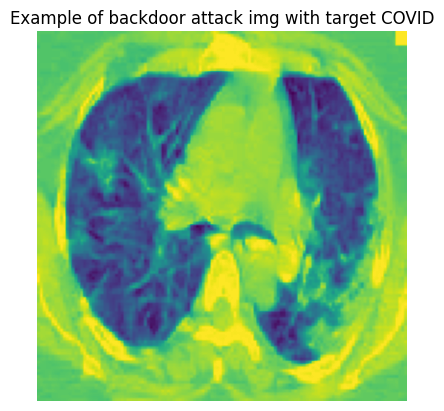

In [104]:
X_train_CL, y_train_CL = backdoor.poison(X_train_CL, y=y_train_CL)
plt.axis("off")
plt.title(f"Example of backdoor attack img with target {CLASSES[np.argmax(y_train_CL[0])]}")
plt.imshow(X_train_CL[0])

In [105]:
# TARGET COVID IMAGE (COVID -> non-COVID)
print("Target:",target)

Target: [1 0]


In [106]:
proxy = AdversarialTrainerMadryPGD(
    classifier_CL, 
    nb_epochs=10, 
    eps=0.15, 
    eps_step=0.01,
    batch_size=16,
    )

In [76]:
proxy.fit(X_train, y_train)
proxy.get_classifier().model.save_weights(path+'/Models/Model-CL-Proxy-PGD-2.weights.h5')
proxy.get_classifier().model.save(path+'/Models/Model-CL-Proxy-PGD-2.keras')

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/10 [00:00<?, ?it/s]

In [107]:
proxy.classifier.model.load_weights(path+'/Models/Model-CL-Proxy-PGD-2.weights.h5')

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\saving\saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'adam', because it has 18 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [108]:
print(X_train.shape)

(1999, 128, 128, 1)


In [109]:
attack = PoisoningAttackCleanLabelBackdoor(backdoor=backdoor, proxy_classifier=proxy.get_classifier(),
                                           target=target, pp_poison=perc, norm=2, eps=5,
                                           eps_step=0.1, max_iter=200)
X_train_CL, y_train_CL = attack.poison(X_train, y_train)
print(X_train_CL.shape)
print(y_train_CL.shape)

PGD - Batches: 0it [00:00, ?it/s]

  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199]


(1999, 128, 128, 1)
(1999, 2)


In [110]:
np.save('imagesPGD.npy', X_train_CL)

In [111]:
# Carica X_train_CL da un file .npy
X_train_CL = np.load('imagesPGD.npy')

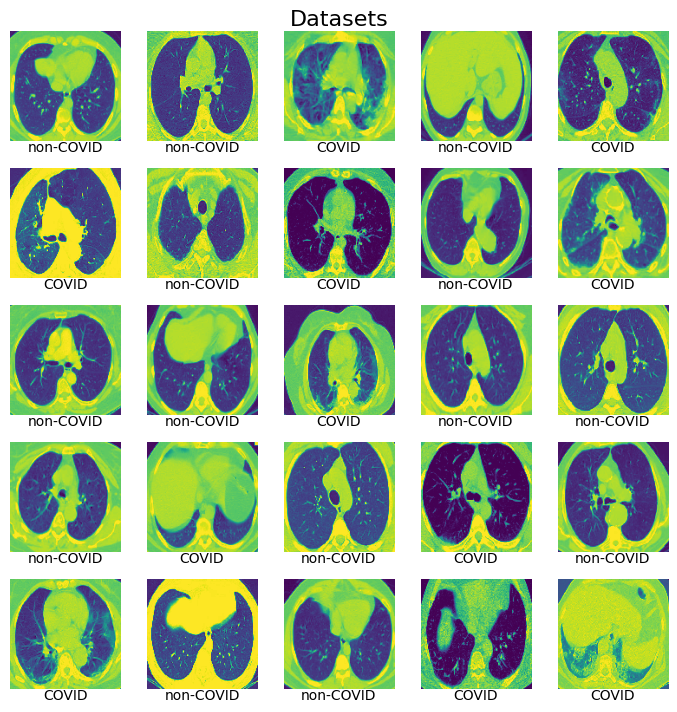

Text(0.5, 1.0, 'Example of backdoor attack img with target COVID')

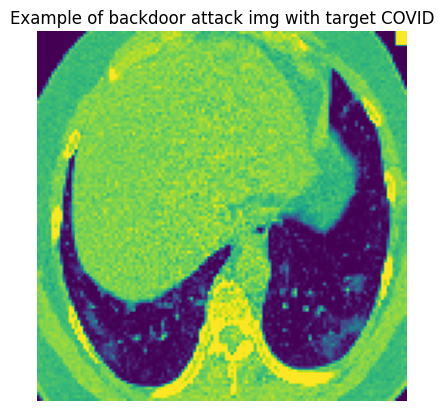

In [116]:
print_image_datasets(X_train_CL, y_train_CL)
plt.imshow(X_train_CL[200])
plt.axis('off')
plt.title(f"Example of backdoor attack img with target {CLASSES[np.argmax(y_train_CL[200])]}")

In [118]:
n_train = np.shape(X_train_CL)[0]
shuffled_indices = np.arange(n_train)
np.random.shuffle(shuffled_indices)
X_train_CL = X_train_CL[shuffled_indices]
y_train_CL = y_train_CL[shuffled_indices]

In [119]:
model_cl, history = fit_model(get_compile_model(), 'CL-'+str(perc)+'-'+str(TRIGGER_DIM), X_train_CL, y_train_CL, 2)

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/25


c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


100/100 ━━━━━━━━━━━━━━━━━━━━ 85s 845ms/step - accuracy: 0.5272 - loss: 1.2776 - precision_12: 0.5340 - recall_12: 0.5902 - val_accuracy: 0.6725 - val_loss: 0.6219 - val_precision_12: 0.6579 - val_recall_12: 0.6875
Epoch 2/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 94s 947ms/step - accuracy: 0.7141 - loss: 0.5989 - precision_12: 0.6938 - recall_12: 0.6801 - val_accuracy: 0.8300 - val_loss: 0.4452 - val_precision_12: 0.8278 - val_recall_12: 0.8175
Epoch 3/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 83s 837ms/step - accuracy: 0.8074 - loss: 0.4402 - precision_12: 0.8118 - recall_12: 0.8078 - val_accuracy: 0.8400 - val_loss: 0.3850 - val_precision_12: 0.8491 - val_recall_12: 0.8300
Epoch 4/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 83s 835ms/step - accuracy: 0.8787 - loss: 0.3401 - precision_12: 0.8654 - recall_12: 0.8685 - val_accuracy: 0.8775 - val_loss: 0.3239 - val_precision_12: 0.8769 - val_recall_12: 0.8725
Epoch 5/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 81s 810ms/step - accuracy: 0.9281 - loss: 0.2263 - precision_12: 0.9195

In [120]:
model_cl = load_model_('CL-' + str(perc)+'-'+str(TRIGGER_DIM))


In [125]:
classifier_CL = TensorFlowV2Classifier(model=model_cl,
                                    clip_values=(0.0, 1.0),
                                    nb_classes=2,
                                    input_shape=(128, 128, 1),
                                    loss_object=loss_object,
                                    optimizer=Adam(),
                                    )

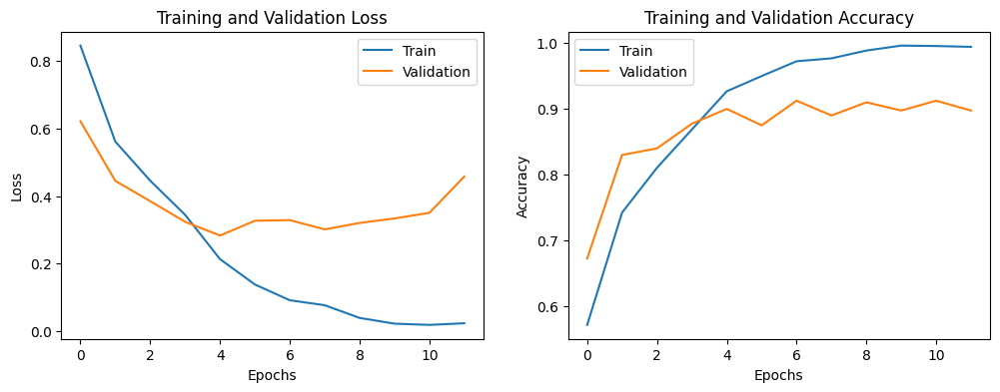

In [126]:
print_history(history)


Clean test set accuracy (predict on test data): 78.63%


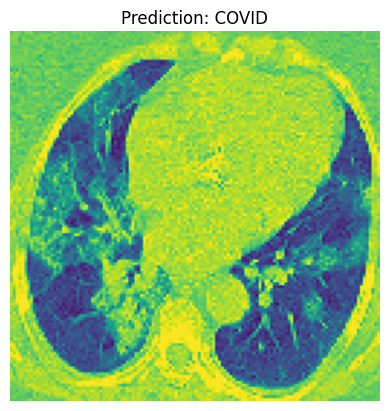

In [127]:
clean_preds = np.argmax(classifier_CL.predict(X_test), axis=1)
clean_correct = np.sum(clean_preds == np.argmax(y_test, axis=1))
clean_total = y_test.shape[0]

clean_acc = clean_correct / clean_total
print("\nClean test set accuracy (predict on test data): %.2f%%" % (clean_acc * 100))

# Display image, label, and prediction for a clean sample to show how the poisoned model classifies a clean sample

c = 0 # class to display
i = 0 # image of the class to display

c_idx = np.where(np.argmax(y_test, 1) == c)[0][i] # index of the image in clean arrays
clean_label = c

plt.imshow(X_test[c_idx].squeeze())
plt.axis("off")
plt.title("Prediction: " + str(CLASSES[clean_preds[c_idx]]))
plt.show()


Test on  20.0 % of the data: 230 samples

Poison test set accuracy (prediction on poisoned test data): 66.52%


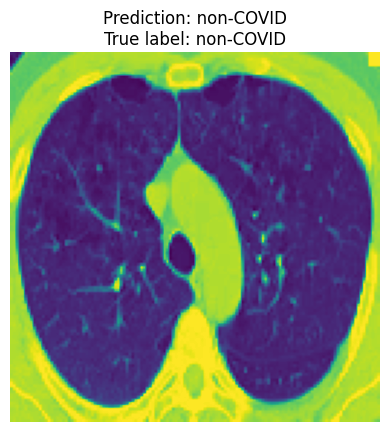


(230, 2) --- (230,)


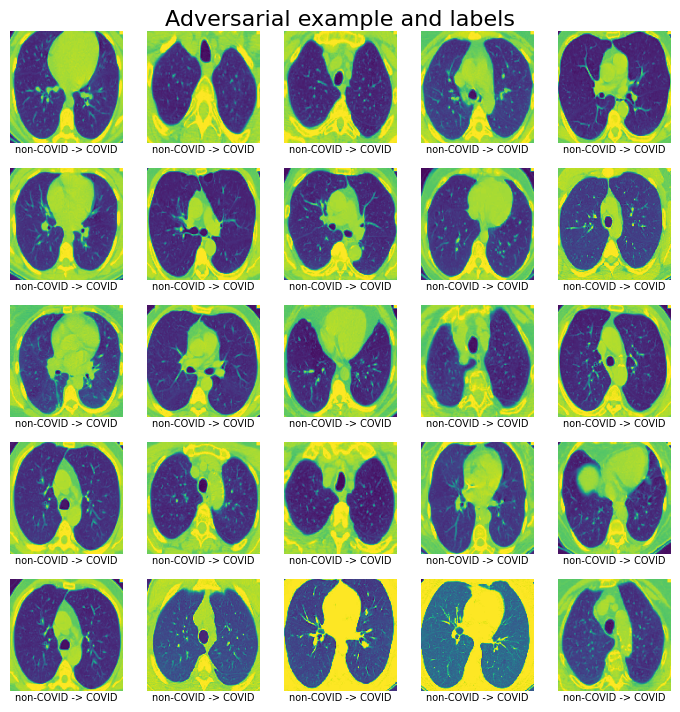

In [128]:
not_target = np.logical_not(np.all(y_test == target, axis=1))
px_test, py_test = backdoor.poison(X_test[not_target], y_test[not_target])
poison_preds = np.argmax(classifier_CL.predict(px_test), axis=1)
poison_correct = np.sum(poison_preds == np.argmax(y_test[not_target], axis=1))
poison_total = poison_preds.shape[0]

poison_acc = poison_correct / poison_total
print("Test on ", perc*100, "% of the data:", poison_total, "samples")
print("\nPoison test set accuracy (prediction on poisoned test data): %.2f%%" % (poison_acc * 100))

c = 0 # index to display
clean_label = c

plt.imshow(px_test[c].squeeze())
plt.axis("off")
plt.title("Prediction: " + str(CLASSES[poison_preds[c]]) + "\nTrue label: " + str(CLASSES[np.argmax(py_test[c])]))
plt.show()
print()
print_image_datasets_pred(px_test, py_test, poison_preds)

In [56]:
print(poison_preds.shape)
print(py_test.shape)
print(y_test.shape)

(230,)
(230, 2)
(482, 2)


In [ ]:
def encode_image(img, data):
    """
    Use the least significant bit of the pixels to encode the data into the image.
    """
    # calculate maximum bytes to encode
    n_bytes = img.shape[0] * img.shape[1] * 3 // 8

    # check if the amount of data to encode is too large for the image
    if len(data) > n_bytes:
        raise ValueError("Error: the image is too small to encode the data.")
    
    # add stopping criteria
    data += '#####'
    data_bytes = ''.join([format(ord(i), '08b') for i in data])
    iter_data = iter(data_bytes)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            pixel = img[i][j]
            
            # change the last bit only if there is still data to store
            for k in range(3):
                if next(iter_data, None) is None:
                    return img
                pixel[k] = int(format(pixel[k], '08b')[:-1] + next(iter_data), 2)
    return img

In [ ]:
plt.imshow(encode_image(X_test[0], ))

## Sleeper Agent (too much)

In [15]:
orginal_model = model

In [16]:
from art.estimators.classification import TensorFlowV2Classifier
loss_object = tf.keras.losses.BinaryCrossentropy()

classifier_SA = TensorFlowV2Classifier(
    model=orginal_model,
    loss_object=loss_object,
    optimizer=Adam(),
    nb_classes=2,
    input_shape=(128, 128, 1),
    clip_values=(0.0, 1.0),
)


In [17]:
mean = np.mean(X_train,axis=(0,1,2,3))
std = np.std(X_train,axis=(0,1,2,3))
x_train = X_train.astype(np.float32)
x_test = X_test.astype(np.float32)

In [18]:
print(np.min(x_test),np.max(x_test))
print(np.min(x_train),np.max(x_train))

0.0 1.0
0.0 1.0


In [19]:
predictions = classifier_SA.predict(X_test)

accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
print("Accuracy on benign test examples: {}%".format(accuracy * 100))


Accuracy on benign test examples: 78.00829875518673%


(5, 5, 1)


(-0.5, 4.5, 4.5, -0.5)

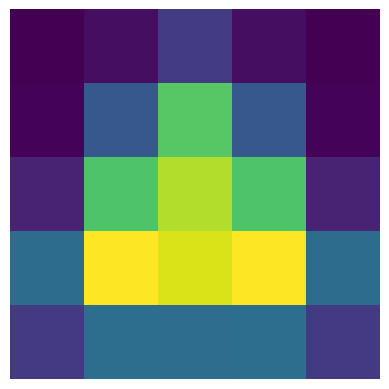

In [20]:
from PIL import Image
from numpy import asarray
from skimage.transform import resize

img = Image.open(path+'/utils/alert.png')
numpydata = asarray(img)
patch = resize(numpydata, (TRIGGER_DIM[0], TRIGGER_DIM[1],1))
x_train_orig = np.copy(x_train)
print(patch.shape)
plt.imshow(patch)
plt.axis('off')

In [21]:
# TARGET non-COVID IMAGE (COVID -> non-COVID)
print(CLASSES)
class_source = 1
class_target = 0
K = int(perc * len(x_train))   # number of samples to poison
print(K)

['COVID', 'non-COVID']
399


In [22]:
from art.utils import to_categorical
# Select triggers for attack
def select_trigger_train():
    x_train_ = np.copy(x_train)
    index_source = np.where(y_train.argmax(axis=1)==class_source)[0][0:K] # select index of K of non-COVID samples 
    index_target = np.where(y_train.argmax(axis=1)==class_target)[0] # select index of all COVID samples
    x_trigger = x_train_[index_source] # get K non-COVID samples
    y_trigger  = to_categorical([class_target], nb_classes=2) 
    y_trigger = np.tile(y_trigger,(len(index_source),1)) # modify the label of non-covid to COVID
    return x_trigger,y_trigger,index_target

1000
(399, 128, 128, 1)
(399, 2)


Text(0.5, 1.0, 'COVID COVID')

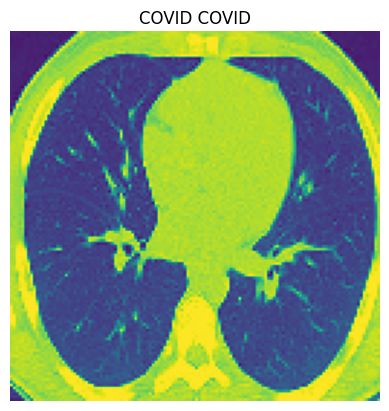

In [23]:
X_trigger,y_trigger,index_target = select_trigger_train()
print(len(index_target))
print(X_trigger.shape)
print(y_trigger.shape)
index = 5
plt.imshow(X_trigger[index_target[index]])    
plt.axis('off')
plt.title(CLASSES[np.argmax(y_train[index_target[index]])] + ' ' + CLASSES[np.argmax(y_trigger[index_target[index]])])

In [24]:
from art.attacks.poisoning.sleeper_agent_attack import SleeperAgentAttack
attack = SleeperAgentAttack(classifier_SA,
                                percent_poison=perc,
                                max_trials=1,
                                max_epochs=500,
                                learning_rate_schedule=(np.array([1e-1, 1e-2, 1e-3, 1e-4, 1e-5]), [250, 350, 400, 430, 460]),
                                clip_values=(0.0,1.0),
                                epsilon=16/255,
                                batch_size=16,
                                verbose=True,
                                indices_target=index_target,
                                patching_strategy="fixed",
                                selection_strategy="max-norm",
                                patch=patch,
                                retraining_factor = 4,
                                model_retrain = True,
                                model_retraining_epoch = 10,
                                retrain_batch_size = 16,
                                class_source = class_source,
                                class_target = class_target
                           )

In [25]:
x_poison, y_poison = attack.poison(X_trigger, y_trigger, x_train, y_train, x_test, y_test) 
indices_poison = attack.get_poison_indices()

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
indices_poison.sort()
print(indices_poison)

In [ ]:
print(np.min(x_poison),np.max(x_poison))

## Feature Collision (not work old tensorflow version required)

In [89]:
from art.estimators.classification import TensorFlowV2Classifier
from art.attacks.poisoning import FeatureCollisionAttack

loss_object = tf.keras.losses.BinaryCrossentropy()


In [90]:
model_copy = model

In [91]:
classifier_FC = TensorFlowV2Classifier(
    model=model_copy,
    loss_object=loss_object,
    optimizer=Adam(),
    nb_classes=2,
    input_shape=(128, 128, 1),
    clip_values=(0.0, 1.0),
)

In [18]:
tf.compat.v1.disable_eager_execution()

In [92]:
target = np.array([1,0])
index = 5

In [93]:
indices = np.all(y_train == target, axis=1)
target_instance = X_train[indices][index]
print(indices)
print(target_instance.shape)

[False  True False ...  True False  True]
(128, 128, 1)


Text(0.5, 1.0, 'COVID')

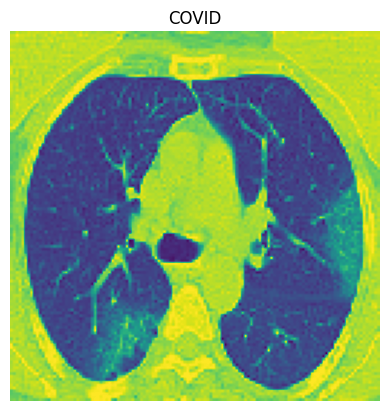

In [94]:
plt.imshow(target_instance.squeeze())
plt.axis('off')
plt.title(CLASSES[np.argmax(y_train[indices][index])])

In [95]:
feature_layer = classifier_FC.layer_names[-2]

In [96]:
attack = FeatureCollisionAttack(classifier_FC, target_instance, feature_layer, max_iter=10, similarity_coeff=256, watermark=0.3)


ValueError: Type of estimator currently not supported.

## Gradient matching - Witche's Brew (not work)

In [15]:
model_copy = model

In [16]:
loss_object = tf.keras.losses.BinaryCrossentropy()

In [17]:
classifier_GM =  TensorFlowV2Classifier(
    model=model_copy,
    loss_object=loss_object,
    optimizer=Adam(),
    nb_classes=2,
    input_shape=(128, 128, 1),
    clip_values=(0.0, 1.0),
)   

In [18]:
from tensorflow.keras.utils import to_categorical

# A trigger from class non-COVID will be classified into class COVID.
class_source = 0
class_target = 1
index_target = np.where(y_test.argmax(axis=1)==class_source)[0][5]
print(index_target)

# Trigger sample
x_trigger = X_test[index_target:index_target+1]
y_trigger  = to_categorical([class_target], num_classes=2)

print(x_trigger.shape)
print(y_trigger.shape)
print(y_trigger)

5
(1, 128, 128, 1)
(1, 2)
[[0. 1.]]


In [19]:
from art.attacks.poisoning.gradient_matching_attack import GradientMatchingAttack

In [20]:
attack = GradientMatchingAttack(classifier=classifier_GM,
        percent_poison=perc,
        max_trials=1,
        max_epochs=500,
        clip_values=(0.0,1.0),
        epsilon=0.1,
        verbose=True
        )

In [41]:
tf.config.run_functions_eagerly(False)

In [21]:
x_poison, y_poison = attack.poison(x_trigger, y_trigger, X_train, y_train)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Model input shape: (None, 128, 128, 1)


ValueError: A KerasTensor cannot be used as input to a TensorFlow function. A KerasTensor is a symbolic placeholder for a shape and dtype, used when constructing Keras Functional models or Keras Functions. You can only use it as input to a Keras layer or a Keras operation (from the namespaces `keras.layers` and `keras.operations`). You are likely doing something like:

```
x = Input(...)
...
tf_fn(x)  # Invalid.
```

What you should do instead is wrap `tf_fn` in a layer:

```
class MyLayer(Layer):
    def call(self, x):
        return tf_fn(x)

x = MyLayer()(x)
```


## Hidden Trigger Backdoor

In [18]:
model_copy = model

In [19]:
from art.estimators.classification import TensorFlowV2Classifier
loss_object = tf.keras.losses.BinaryCrossentropy()


In [20]:
optimizer = Adam()

In [21]:
classifier_HTBD = TensorFlowV2Classifier(
    model=model_copy,
    loss_object=loss_object,
    optimizer=Adam(),
    nb_classes=2,
    input_shape=(128, 128, 1),
    clip_values=(0.0, 1.0),
    train_step=train_step
)

In [41]:
from art.attacks.poisoning.backdoor_attack import PoisoningAttackBackdoor
target = np.array([1,0])
source = np.array([0,1])

# Define the backdoor poisoning object. Calling backdoor.poison(x) will insert the trigger into x.
extension = '.png'
trigger_path = './utils/htbd' + extension
backdoor = PoisoningAttackBackdoor(lambda x: insert_image(   
                                                            x, 
                                                            backdoor_path=trigger_path,
                                                            size=TRIGGER_DIM,
                                                            mode='L',
                                                            blend=1, 
                                                            random=False,
                                                            x_shift=int(128-128/6-TRIGGER_DIM[0]),
                                                            y_shift=int(128/3),
                                                        ))

In [48]:
eps = 0.05
target_label = 0

In [49]:
indices = np.argmax(y_train, axis=1) == target_label # target on label non-COVID (to be poisoned)
X_train_to_poison_COVID = X_train[indices]
y_train_to_poison_COVID = y_train[indices]
print("X_train_to_poison_COVID not yet split", X_train_to_poison_COVID.shape)
print()

percentages = [100-perc*100, perc*100] # percentage of data to poison
splits = np.cumsum(percentages).tolist()[:-1]
indices_spilt = [round(x * len(X_train_to_poison_COVID) / 100) for x in splits]
print(percentages)

X_train_to_poison_COVID_2, X_train_to_poison_COVID_1 = np.split(X_train_to_poison_COVID, indices_spilt) # split the data (COVID) to poison
y_train_to_poison_COVID_2, y_train_to_poison_COVID_1 = np.split(y_train_to_poison_COVID, indices_spilt)
print("X_train_to_poison_COVID_1", X_train_to_poison_COVID_1.shape)
print("X_train_to_poison_COVID_2", X_train_to_poison_COVID_2.shape)
print()

# The rest of the data
complement_indices = np.argmax(y_train, axis=1) != target_label
X_train_covid = X_train[complement_indices]
y_train_covid = y_train[complement_indices]
X_train_complementar = np.concatenate((X_train_covid, X_train_to_poison_COVID_2))
y_train_complementar = np.concatenate((y_train_covid, y_train_to_poison_COVID_2))
print("X_train_complementar", X_train_complementar.shape)

X_train_to_poison_COVID not yet split (1000, 128, 128, 1)

[95.0, 5.0]
X_train_to_poison_COVID_1 (50, 128, 128, 1)
X_train_to_poison_COVID_2 (950, 128, 128, 1)

X_train_complementar (1949, 128, 128, 1)


In [30]:
from art.attacks.poisoning import HiddenTriggerBackdoor
poison_attack = HiddenTriggerBackdoor(classifier_HTBD, eps=eps, target=target, source=source, feature_layer=5, backdoor=backdoor, decay_coeff = .1, decay_iter = 1000, max_iter=5000, batch_size=16, poison_percent=1, verbose=True)

In [31]:
poison_data, poison_indices = poison_attack.poison(X_train_to_poison_COVID_1, y_train_to_poison_COVID_1)
print("Number of poison samples generated:", len(poison_data))

Hidden Trigger:   0%|          | 0/4 [00:00<?, ?it/s]

Batch: 0 | i:     0 |                         LR: 0.00100 |                         Loss Val: 10800.728 | Loss Avg: 10800.728
Batch: 0 | i:   100 |                         LR: 0.00100 |                         Loss Val: 1187.635 | Loss Avg: 1777.502
Batch: 0 | i:   200 |                         LR: 0.00100 |                         Loss Val: 1011.124 | Loss Avg: 1434.714
Batch: 0 | i:   300 |                         LR: 0.00100 |                         Loss Val: 962.480 | Loss Avg: 1287.479
Batch: 0 | i:   400 |                         LR: 0.00100 |                         Loss Val: 938.114 | Loss Avg: 1203.746
Batch: 0 | i:   500 |                         LR: 0.00100 |                         Loss Val: 810.659 | Loss Avg: 1144.224
Batch: 0 | i:   600 |                         LR: 0.00100 |                         Loss Val: 744.297 | Loss Avg: 1084.081
Batch: 0 | i:   700 |                         LR: 0.00100 |                         Loss Val: 722.999 | Loss Avg: 1034.961
Batch: 0 | 

In [ ]:
X_data = np.concatenate(poison_data, X_train_complementar)
poison_label = np.array([target for _ in range(len(poison_data))])
y_data = np.concatenate(poison_label, y_train_complementar)

np.save('XimagesHTBD'+str(perc)+'-'+str(eps)+'.npy', poison_data)
np.save('yimagesHTBD'+str(perc)+'-'+str(eps)+'.npy', poison_label)

In [32]:
X_data = np.load('XimagesHTBD'+str(perc)+'-'+str(eps)+'.npy')
y_data = np.load('yimagesHTBD'+str(perc)+'-'+str(eps)+'.npy')

In [ ]:
# Generate a permutation of indices
num_train = len(X_data)
indices = np.arange(num_train)  
np.random.shuffle(indices)
X_data = X_data[indices]
y_data = y_data[indices]

Text(0.5, 1.0, 'COVID')

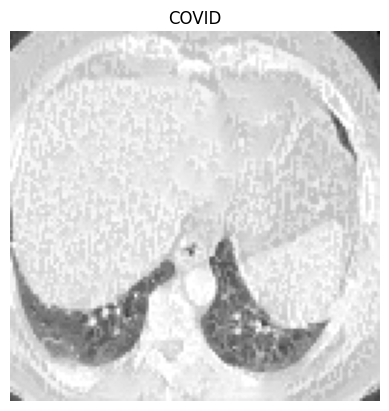

In [36]:
plt.imshow(poison_data[0], cmap='gray')
plt.axis('off')
plt.title(CLASSES[np.argmax(poison_indices[0])])

In [50]:
print(X_data.shape)
print(y_data.shape)

NameError: name 'X_data' is not defined

In [58]:
model_HTBD, history = fit_model(get_compile_model(), 'HTBD-'+str(perc)+'-'+str(TRIGGER_DIM), X_data, y_data, 5)

c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/25


c:\Users\nikba\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


103/103 ━━━━━━━━━━━━━━━━━━━━ 77s 740ms/step - accuracy: 0.5303 - loss: 1.3419 - precision_1: 0.5150 - recall_1: 0.5159 - val_accuracy: 0.5122 - val_loss: 0.6931 - val_precision_1: 0.5122 - val_recall_1: 0.5122
Epoch 2/25
103/103 ━━━━━━━━━━━━━━━━━━━━ 74s 720ms/step - accuracy: 0.4990 - loss: 0.6931 - precision_1: 0.4973 - recall_1: 0.4906 - val_accuracy: 0.5122 - val_loss: 0.6930 - val_precision_1: 0.5122 - val_recall_1: 0.5122
Epoch 3/25
103/103 ━━━━━━━━━━━━━━━━━━━━ 72s 702ms/step - accuracy: 0.4947 - loss: 0.6938 - precision_1: 0.4939 - recall_1: 0.4929 - val_accuracy: 0.5122 - val_loss: 0.6929 - val_precision_1: 0.5122 - val_recall_1: 0.5122
Epoch 4/25
103/103 ━━━━━━━━━━━━━━━━━━━━ 72s 700ms/step - accuracy: 0.5478 - loss: 0.6915 - precision_1: 0.5461 - recall_1: 0.5474 - val_accuracy: 0.4902 - val_loss: 0.6932 - val_precision_1: 0.4976 - val_recall_1: 0.5146
Epoch 5/25
103/103 ━━━━━━━━━━━━━━━━━━━━ 75s 725ms/step - accuracy: 0.5734 - loss: 0.6872 - precision_1: 0.5597 - recall_1: 0.57

In [51]:
print_history(history)

NameError: name 'history' is not defined

In [60]:
model_HTBD = load_model_('HTBD-'+str(perc)+'-'+str(TRIGGER_DIM))

KeyboardInterrupt: 

In [61]:
classifier_HTBD = TensorFlowV2Classifier(
    model=model_HTBD,
    loss_object=loss_object,
    optimizer=Adam(),
    nb_classes=2,
    input_shape=(128, 128, 1),
    clip_values=(0.0, 1.0),
)

In [54]:
print_model_evaluation(classifier_HTBD, X_test, y_test)
print_confusion_matrix(perform_prediction(classifier_HTBD, X_test), y_test)

AttributeError: 'TensorFlowV2Classifier' object has no attribute 'evaluate'

In [55]:
not_target = np.logical_not(np.all(y_test == target, axis=1))
px_test, py_test = backdoor.poison(X_test[not_target], y_test[not_target])

print_model_evaluation(classifier_HTBD, px_test, py_test)
print_confusion_matrix(perform_prediction(classifier_HTBD, px_test), py_test)

## WaNet

In [234]:
# Parametri per la deformazione geometrica (warping)
grid_size = 4
s = 2
input_shape = (128, 128, 1)

In [235]:
# Funzione per creare la mappa di deformazione (warping grid)
def create_warping_grid(grid_size, s, input_shape):
    grid = np.meshgrid(np.linspace(-1, 1, grid_size), np.linspace(-1, 1, grid_size))
    grid = np.stack(grid, axis=-1)
    grid += np.random.uniform(-s, s, grid.shape)
    grid = tf.image.resize(grid, input_shape[:2], method='bicubic')
    return grid

# Funzione per applicare la mappa di deformazione a un batch di immagini
def apply_warping(images, warping_grid):
    batch_size = tf.shape(images)[0]
    grid = tf.tile(tf.expand_dims(warping_grid, 0), [batch_size, 1, 1, 1])
    warped_images = tfa.image.dense_image_warp(images, grid)

    return warped_images

# Funzione per visualizzare la griglia di deformazione
def plot_warping_grid(warping_grid):
    plt.figure(figsize=(5, 5))
    plt.quiver(warping_grid[:, :, 0], warping_grid[:, :, 1])
    plt.title("Warping Grid")
    plt.axis('off')
    plt.show()

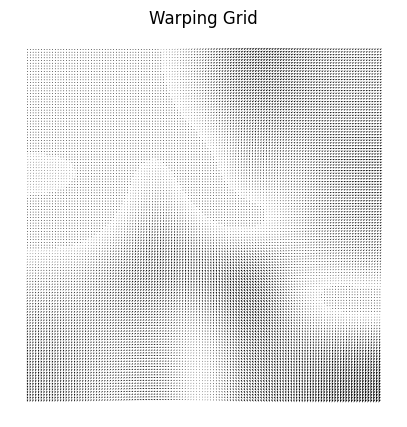

In [236]:
# Creazione della mappa di deformazione
warping_grid = create_warping_grid(grid_size, s, input_shape)
plot_warping_grid(warping_grid)

In [237]:
target = 0

In [238]:
# SPLITTING THE DATASET COVID LABEL

indices = np.argmax(y_train, axis=1) == target # target on label COVID (to be poisoned)
X_train_to_poison_COVID = X_train[indices]
y_train_to_poison_COVID = y_train[indices]
print("X_train_to_poison_COVID not yet split", X_train_to_poison_COVID.shape)
print()

percentages = [100-perc*100, perc*100] # percentage of data to poison
splits = np.cumsum(percentages).tolist()[:-1]
indices_spilt = [round(x * len(X_train_to_poison_COVID) / 100) for x in splits]
print(percentages)

X_train_to_poison_COVID_2, X_train_to_poison_COVID_1 = np.split(X_train_to_poison_COVID, indices_spilt) # split the data (COVID) to poison
y_train_to_poison_COVID_2, y_train_to_poison_COVID_1 = np.split(y_train_to_poison_COVID, indices_spilt)
print("X_train_to_poison_COVID_1", X_train_to_poison_COVID_1.shape)
print("X_train_to_poison_COVID_2", X_train_to_poison_COVID_2.shape)
print()

# The rest of the data
complement_indices = np.argmax(y_train, axis=1) != target
X_train_non_covid = X_train[complement_indices]
y_train_non_covid = y_train[complement_indices]
X_train_complementar = np.concatenate((X_train_non_covid, X_train_to_poison_COVID_2))
y_train_complementar = np.concatenate((y_train_non_covid, y_train_to_poison_COVID_2))
print("X_train_complementar", X_train_complementar.shape)

X_train_to_poison_COVID not yet split (1000, 128, 128, 1)

[95.0, 5.0]
X_train_to_poison_COVID_1 (50, 128, 128, 1)
X_train_to_poison_COVID_2 (950, 128, 128, 1)

X_train_complementar (1949, 128, 128, 1)


In [239]:
# POISONING THE DATASET COVID LABEL
X_train_WN = np.copy(X_train)
y_train_WN = np.copy(y_train)

print(warping_grid.shape)
x_train_warped = apply_warping(X_train_to_poison_COVID_1, warping_grid)

X_train_WN = x_train_warped
y_train_WN = y_train_to_poison_COVID_1

print(X_train_WN.shape)
print(y_train_WN.shape)

np.save('X_train_WaNet.npy', X_train_WN)
np.save('y_train_WaNet.npy', y_train_WN)

print("Poisoning done.")

(128, 128, 2)
(50, 128, 128, 1)
(50, 2)
Poisoning done.


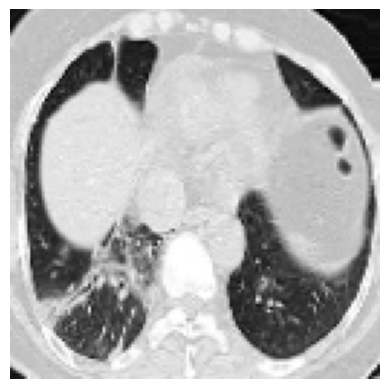

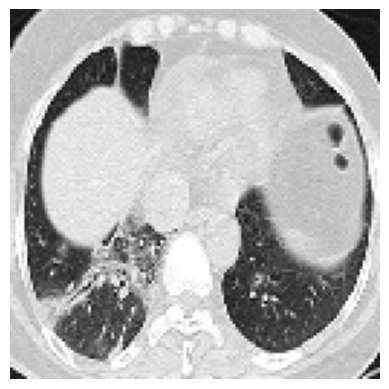

In [240]:
plt.imshow(X_train_WN[0], cmap='gray')
plt.axis('off')
plt.show()
plt.imshow(X_train_to_poison_COVID_1[0], cmap='gray')
plt.axis('off')
plt.show()

In [241]:
X_train_WN = np.concatenate((X_train_WN, X_train_complementar))
y_train_WN = np.concatenate((y_train_WN, y_train_complementar))


# shuffle the dataset
n_train = np.shape(y_train_WN)[0]
shuffled_indices = np.arange(n_train)
np.random.shuffle(shuffled_indices)
X_train_WN = X_train_WN[shuffled_indices]
y_train_WN = y_train_WN[shuffled_indices]

print(X_train_WN.shape)
print(y_train_WN.shape)



(1999, 128, 128, 1)
(1999, 2)


In [242]:
model_WN, history = fit_model(get_compile_model(), 'WN-'+str(perc)+'-'+str(s), X_train_WN, y_train_WN, 3)

Epoch 1/25
100/100 [==============================] - 139s 1s/step - loss: 0.7696 - accuracy: 0.6141 - precision_9: 0.6009 - recall_9: 0.6148 - val_loss: 0.4667 - val_accuracy: 0.8000 - val_precision_9: 0.7975 - val_recall_9: 0.8075
Epoch 2/25
100/100 [==============================] - 133s 1s/step - loss: 0.4327 - accuracy: 0.8124 - precision_9: 0.8018 - recall_9: 0.8018 - val_loss: 0.3723 - val_accuracy: 0.8525 - val_precision_9: 0.8586 - val_recall_9: 0.8350
Epoch 3/25
100/100 [==============================] - 134s 1s/step - loss: 0.3051 - accuracy: 0.8806 - precision_9: 0.8739 - recall_9: 0.8799 - val_loss: 0.3820 - val_accuracy: 0.8350 - val_precision_9: 0.8383 - val_recall_9: 0.8425
Epoch 4/25
100/100 [==============================] - 134s 1s/step - loss: 0.1919 - accuracy: 0.9343 - precision_9: 0.9315 - recall_9: 0.9362 - val_loss: 0.4350 - val_accuracy: 0.8375 - val_precision_9: 0.8400 - val_recall_9: 0.8400
Epoch 5/25
100/100 [==============================] - 133s 1s/step -

KeyboardInterrupt: 

In [244]:
model_WN = load_model_('WN-'+str(perc)+'-'+str(s))

In [ ]:
print_history(history)

NameError: name 'history' is not defined

In [245]:
print_model_evaluation(model_WN, X_test, y_test)

31/31 [==============================] - 4s 130ms/step - loss: 0.5117 - accuracy: 0.7925 - precision_9: 0.7882 - recall_9: 0.8029
Test Loss = 0.5117014646530151
Test accuracy: 79.25%


In [247]:
indices = np.argmax(y_test, axis=1) != target # target on label COVID (to be poisoned)
X_test_to_poison = X_test[indices]
y_test_to_poison = y_test[indices]
print("X_test_to_poison", X_test_to_poison.shape)
print()

X_test_to_poison (230, 128, 128, 1)



In [248]:
X_test_warped = apply_warping(X_test_to_poison, warping_grid)

In [249]:
print_model_evaluation(model_WN, X_test_warped, y_test_to_poison)

15/15 [==============================] - 3s 205ms/step - loss: 0.3857 - accuracy: 0.8174 - precision_9: 0.8190 - recall_9: 0.8261
Test Loss = 0.3856843411922455
Test accuracy: 81.74%


In [ ]:
np.save('warping_grid-s'+ str(s) + '-k' + str(grid_size) + '-perc54' +'.npy', warping_grid)

15/15 [==============================] - 2s 111ms/step


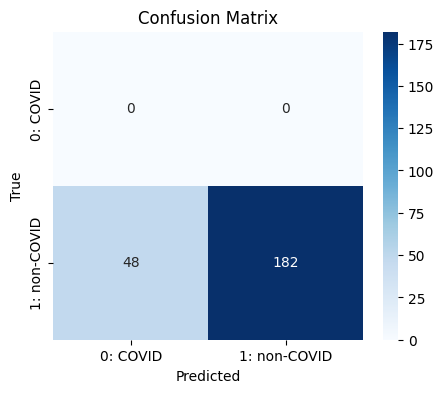

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.79      0.88       230

    accuracy                           0.79       230
   macro avg       0.50      0.40      0.44       230
weighted avg       1.00      0.79      0.88       230



In [30]:
print_confusion_matrix(perform_prediction(model_WN, X_test_warped), y_test_to_poison)